# Energy system model of the Spain

In [7]:
import calliope
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

calliope.set_log_verbosity("INFO", include_solver_output=True)

# 1. Reference case
### 1.1. Create and solve the model

In [8]:
model = calliope.read_yaml('model/model.yaml',scenario='base')

[2025-12-12 18:12:20] INFO     Loading overrides from scenario: base 
[2025-12-12 18:12:20] INFO     (scenarios, base ) | Applying the following overrides: [].
[2025-12-12 18:12:20] INFO     Math init | loading pre-defined math.
[2025-12-12 18:12:20] INFO     Math init | loading math files {'storage_inter_cluster', 'spores', 'milp', 'operate', 'base'}.
[2025-12-12 18:12:20] INFO     Model: preprocessing data
[2025-12-12 18:12:20] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-12 18:12:20] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 18:12:20] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 18:12:20] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 18:12:20] INFO     input data `name` not defined in model math; it will not be available in 

In [9]:
model.inputs.sink_use_equals.to_series().dropna()

timesteps            nodes  techs       
2024-01-01 00:00:00  NLD    demand_power    21863.416667
2024-01-01 01:00:00  NLD    demand_power    21200.666667
2024-01-01 02:00:00  NLD    demand_power    20033.083333
2024-01-01 03:00:00  NLD    demand_power    18867.666667
2024-01-01 04:00:00  NLD    demand_power    18137.166667
                                                ...     
2024-12-30 19:00:00  NLD    demand_power    32269.333333
2024-12-30 20:00:00  NLD    demand_power    32806.250000
2024-12-30 21:00:00  NLD    demand_power    32516.666667
2024-12-30 22:00:00  NLD    demand_power    30309.833333
2024-12-30 23:00:00  NLD    demand_power    27405.333333
Name: sink_use_equals, Length: 8759, dtype: float64

In [10]:
model.build()
model.solve()

[2025-12-12 18:12:24] INFO     Model: backend build starting
[2025-12-12 18:12:24] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-12 18:12:24] INFO     Optimisation Model | variables | Generated.
[2025-12-12 18:12:25] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-12 18:12:29] INFO     Optimisation Model | constraints | Generated.
[2025-12-12 18:12:29] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-12 18:12:29] INFO     Optimisation Model | objectives | Generated.
[2025-12-12 18:12:29] INFO     Model: backend build complete
[2025-12-12 18:12:31] INFO     Optimisation model | starting model in base mode.
[2025-12-12 18:12:34] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpnsu0nzu_.pyomo.lp
Reading time = 0.34 seconds
x1: 201475 rows, 140160 columns, 367911 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [11]:
# It is helpful to store the model results as a whole in NetCDF format, which Calliope can import back
# at any later time. 
model.to_netcdf('results/default_results.nc')

In [53]:
# Alternatively, results can be exported as a series of .csv files for inspection and analysis in Excel or
# other software that may benefit from .csv data
# model.to_csv('results/default_results_csv')

### 1.2. Marginal technology

In [12]:
# Shadow price for the power system balance constraint
balance_price = model.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.007627
1,NLD,power,2024-01-01 01:00:00,0.007627
2,NLD,power,2024-01-01 02:00:00,-0.0
3,NLD,power,2024-01-01 03:00:00,-0.0
4,NLD,power,2024-01-01 04:00:00,-0.0


<Axes: >

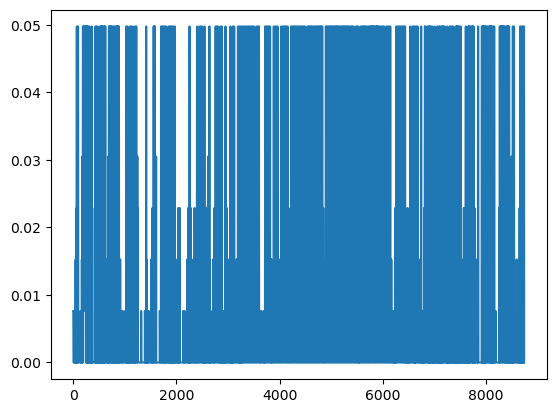

In [13]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-01-01','2024-12-30',freq='h') 
# Plot the days of interest
balance_price['system_balance'].loc[balance_price['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [14]:
variable_costs = model.results.cost_operation_variable.to_series().dropna()
generation = model.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs = variable_costs/generation

# tranform to a DataFrame
marginal_generation_costs = marginal_generation_costs.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs = marginal_generation_costs.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs.head()


,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [15]:
# Merge marginal generation costs with balance price
merged = marginal_generation_costs.merge(
    balance_price,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.007627
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.007627
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,-0.0
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,-0.0
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,-0.0


In [16]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  42815 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [17]:
# turn system_balance and marginal_generation_cost into float type
merged['system_balance'] = merged['system_balance'].astype(float)
merged['marginal_generation_cost'] = merged['marginal_generation_cost'].astype(float)

# drop rows with NaN values in marginal_generation_cost
merged = merged.dropna(subset=['marginal_generation_cost'])
merged.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42815 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     42815 non-null  object        
 1   techs                     42815 non-null  object        
 2   costs                     42815 non-null  object        
 3   timesteps                 42815 non-null  datetime64[ns]
 4   carriers                  42815 non-null  object        
 5   marginal_generation_cost  42815 non-null  float64       
 6   system_balance            42815 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 2.6+ MB


In [18]:
# Compute absolute difference between marginal cost and price
merged['diff'] = (merged['marginal_generation_cost'] - merged['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech = (
    merged.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,nuclear,0.007627,7.627216e-03,5.641519e-08
1,2024-01-01 01:00:00,NLD,nuclear,0.007627,7.627011e-03,2.615026e-07
2,2024-01-01 02:00:00,NLD,wind_onshore,0.001508,-3.611839e-10,1.508000e-03
3,2024-01-01 03:00:00,NLD,wind_onshore,0.001508,-3.684209e-10,1.508000e-03
4,2024-01-01 04:00:00,NLD,wind_onshore,0.001508,-3.709701e-10,1.508000e-03


In [19]:
# save marginal_tech to csv
marginal_tech.to_csv('results/marginal_tech.csv', index=False)

In [20]:
tech_colors = {
    "load_shedding": "#000000",
    "ccgt": "#E37A72",
    "nuclear": "#F3007A",
    "hydro": "#7900f3",
    "solar_pv": "#F9D956",
    "wind_onshore": "#56F9C0",
    "wind_offshore": "#56CBF9"
}

In [21]:
# display timesteps in days_of_interest only
marginal_tech_month = marginal_tech[marginal_tech['timesteps'].isin(days_of_interest)]
marginal_tech_month

,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,nuclear,0.007627,7.627216e-03,5.641519e-08
1,2024-01-01 01:00:00,NLD,nuclear,0.007627,7.627011e-03,2.615026e-07
2,2024-01-01 02:00:00,NLD,wind_onshore,0.001508,-3.611839e-10,1.508000e-03
3,2024-01-01 03:00:00,NLD,wind_onshore,0.001508,-3.684209e-10,1.508000e-03
4,2024-01-01 04:00:00,NLD,wind_onshore,0.001508,-3.709701e-10,1.508000e-03
...,...,...,...,...,...,...
8732,2024-12-29 20:00:00,NLD,ccgt,0.049768,4.976842e-02,5.327906e-09
8733,2024-12-29 21:00:00,NLD,ccgt,0.049768,4.976842e-02,5.795766e-09
8734,2024-12-29 22:00:00,NLD,ccgt,0.049768,4.976841e-02,1.351429e-08
8735,2024-12-29 23:00:00,NLD,hydro,0.030000,2.287995e-02,7.120046e-03


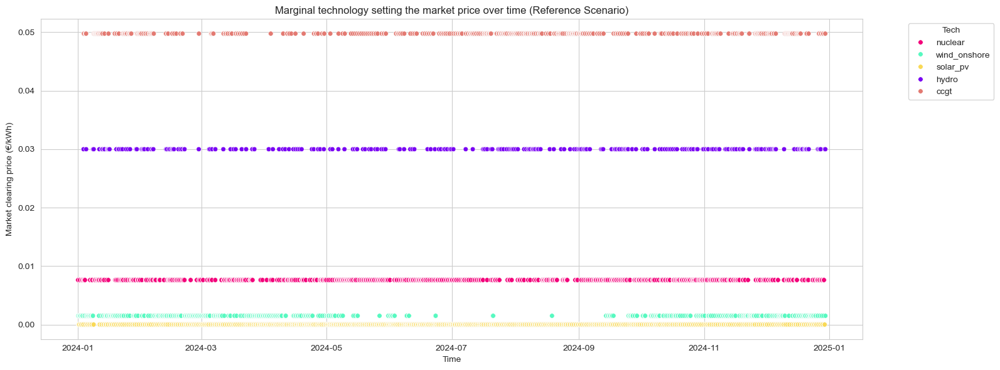

In [22]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_month,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Reference Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
solar_pv        3738
nuclear         1803
wind_onshore    1460
ccgt            1458
hydro            278
Name: count, dtype: int64
techs
solar_pv        0.427836
nuclear         0.206364
wind_onshore    0.167105
ccgt            0.166877
hydro           0.031819
Name: share, dtype: float64
[2025-12-12 18:13:48] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_4340\1299318736.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(

[2025-12-12 18:13:48] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_4340\1299318736.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')



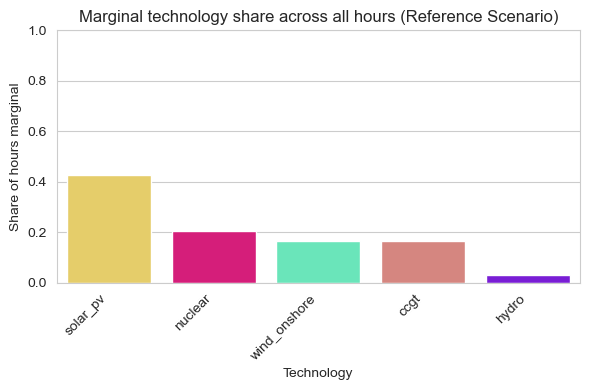

In [23]:
# Count how many hours each tech is marginal
freq = marginal_tech_month['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Marginal technology share across all hours (Reference Scenario)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 1.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [43]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [44]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/default_results.nc', plot_export_path='results/default_dispatch.html')

[2025-12-12 17:27:13] INFO     Model: preprocessing data (reentry)
[2025-12-12 17:27:13] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-12 17:27:13] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 17:27:13] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 17:27:13] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 17:27:13] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 17:27:13] INFO     Model: initialisation complete


## 1.4.  Load, residual load and price duration curves

In [45]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [46]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model = calliope.read_netcdf('results/default_results.nc')

[2025-12-12 17:28:21] INFO     Model: preprocessing data (reentry)
[2025-12-12 17:28:21] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-12 17:28:21] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 17:28:21] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 17:28:21] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 17:28:21] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-12 17:28:22] INFO     Model: initialisation complete


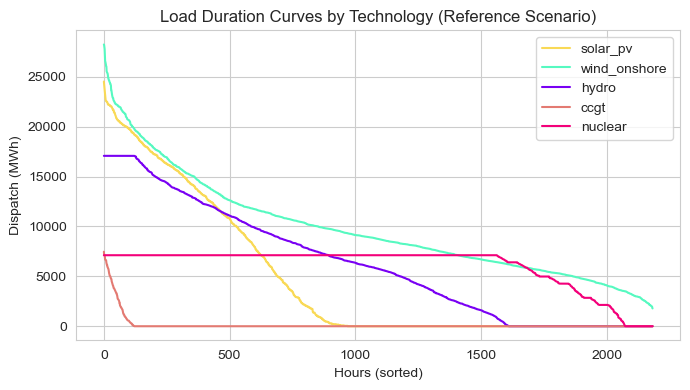

In [47]:
dispatch = {}
for tech in gen_techs:
    series = (
        model.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Reference Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [71]:
# Suppose we want to plot the LDC of the dispatch of the CCGT power plant
#ccgt_dispatch = model.results.flow_out.sel(techs='ccgt').to_series().dropna()
#ccgt_dispatch.head()

In [72]:
#plot_load_duration_curve(dataframe=ccgt_dispatch.to_frame(), 
                         #plot_export_path='results/default_ccgt_ldc.html', 
                         #y_label='Flow out (MWh)')

In [48]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price['system_balance'].to_frame(), 
                         plot_export_path='results/default_price.html', 
                         y_label='Price (EUR/kWh)')

In [74]:
# Obtain demand from input
demand = model.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model.results.flow_out.sel(techs='wind_onshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load = demand - (solar_pv_dispatch + wind_onshore_dispatch)
residual_load.head()

timesteps            nodes  carriers
2024-10-01 00:00:00  NLD    power       18482.351060
2024-10-01 01:00:00  NLD    power       17124.547769
2024-10-01 02:00:00  NLD    power       15988.931413
2024-10-01 03:00:00  NLD    power       15260.833297
2024-10-01 04:00:00  NLD    power       14931.385135
dtype: float64

In [75]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/default_residual_load.html',
                         y_label='Residual Load (MWh)')


### 1.5. CO2 emissions

In [76]:
# to get hourly generation for all techs, power carrier only
power_gen = model.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [77]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [78]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [79]:
# Total across all emitting techs
total_emissions_t = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 1,416,983.95 tCO2

Total CO2 emissions: 1,416,983.95 tCO2
Total CO2 emissions: 1.417 MtCO2


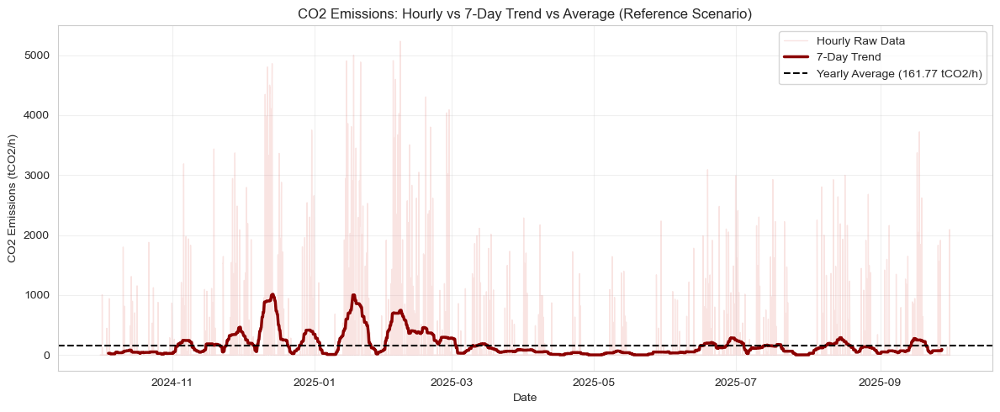

In [80]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Reference Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 1.6. Cost recovery

In [81]:
# Flow out for all gen techs in one go
dispatch = (
    model.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-10-01 00:00:00,549.950238,4481.032035,12482.351062,0.000004,5999.999997
1,NLD,2024-10-01 01:00:00,530.303485,4823.232080,11124.547771,0.000004,5999.999997
2,NLD,2024-10-01 02:00:00,493.366528,5145.118725,9988.931415,0.000004,5999.999997
3,NLD,2024-10-01 03:00:00,459.898204,5507.685166,9260.833298,0.000004,5999.999997
4,NLD,2024-10-01 04:00:00,331.850088,5927.348110,8931.385137,0.000004,5999.999997


In [82]:
# Shadow price dataframe
balance_price = (
    model.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price

# Merge price into dispatch
df = balance_price.merge(dispatch, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-10-01 00:00:00,0.03,NLD,549.950238,4481.032035,12482.351062,0.000004,5999.999997
1,NLD,power,2024-10-01 01:00:00,0.03,NLD,530.303485,4823.232080,11124.547771,0.000004,5999.999997
2,NLD,power,2024-10-01 02:00:00,0.03,NLD,493.366528,5145.118725,9988.931415,0.000004,5999.999997
3,NLD,power,2024-10-01 03:00:00,0.03,NLD,459.898204,5507.685166,9260.833298,0.000004,5999.999997
4,NLD,power,2024-10-01 04:00:00,0.03,NLD,331.850088,5927.348110,8931.385137,0.000004,5999.999997


In [83]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv        1.152057e+06
wind_onshore    1.616877e+06
hydro           2.568349e+06
ccgt            1.679073e+05
nuclear         1.521232e+06
Name: revenue, dtype: float64

In [84]:
cost = (
    model.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost = cost.droplevel('costs')                # or just drop the level
cost.name = 'cost'
cost


techs
solar_pv        5.631976e+02
wind_onshore    8.459306e+04
hydro           2.214559e+06
ccgt            1.679073e+05
nuclear         3.831336e+05
Name: cost, dtype: float64

In [85]:
# calculate profit and cost recovery ratio
covery = pd.concat([revenue, cost], axis=1)
covery['profit'] = covery['revenue'] - covery['cost'] # >0 means revenue covers cost
covery['cost_recovery_ratio'] = covery['revenue'] / covery['cost']  # >1 means full recovery
covery

,revenue,cost,profit,cost_recovery_ratio
solar_pv,1.152057e+06,5.631976e+02,1.151494e+06,2045.564721
wind_onshore,1.616877e+06,8.459306e+04,1.532284e+06,19.113590
hydro,2.568349e+06,2.214559e+06,3.537894e+05,1.159756
ccgt,1.679073e+05,1.679073e+05,-6.637422e-04,1.000000
nuclear,1.521232e+06,3.831336e+05,1.138098e+06,3.970499


In [86]:
covery_df = covery.reset_index()
covery_df.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,1.152057e+06,5.631976e+02,1.151494e+06,2045.564721
1,wind_onshore,1.616877e+06,8.459306e+04,1.532284e+06,19.113590
2,hydro,2.568349e+06,2.214559e+06,3.537894e+05,1.159756
3,ccgt,1.679073e+05,1.679073e+05,-6.637422e-04,1.000000
4,nuclear,1.521232e+06,3.831336e+05,1.138098e+06,3.970499


[2025-12-09 21:19:29] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\2813374425.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-09 21:19:29] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\2813374425.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




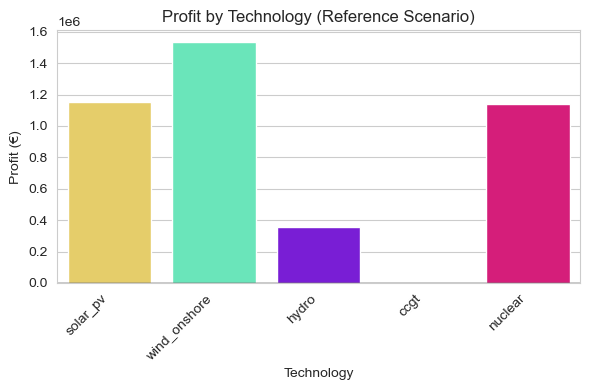

[2025-12-09 21:19:29] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\2813374425.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





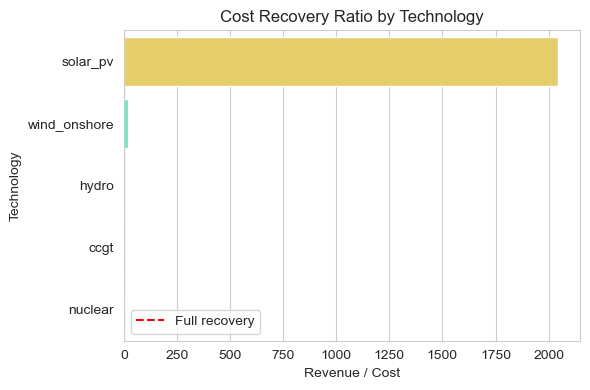

In [87]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Reference Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 2. Renewables growth case
### 2.1. Reload the model with a scenario that forces a higher capacity of renewables and re-solve

In [88]:
model = calliope.read_yaml('model/model.yaml',scenario='more_renewables')

[2025-12-09 21:19:29] INFO     Loading overrides from scenario: more_renewables 
[2025-12-09 21:19:29] INFO     (scenarios, more_renewables ) | Applying the following overrides: ['higher_wind', 'higher_solar'].
[2025-12-09 21:19:29] INFO     Math init | loading pre-defined math.
[2025-12-09 21:19:29] INFO     Math init | loading math files {'base', 'milp', 'operate', 'spores', 'storage_inter_cluster'}.
[2025-12-09 21:19:29] INFO     Model: preprocessing data
[2025-12-09 21:19:29] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:19:30] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:30] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:30] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:30] INFO     input data `name` not 

In [89]:
model.build()
model.solve()

[2025-12-09 21:19:30] INFO     Model: backend build starting
[2025-12-09 21:19:30] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-09 21:19:32] INFO     Optimisation Model | variables | Generated.
[2025-12-09 21:19:32] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-09 21:19:37] INFO     Optimisation Model | constraints | Generated.
[2025-12-09 21:19:37] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-09 21:19:37] INFO     Optimisation Model | objectives | Generated.
[2025-12-09 21:19:37] INFO     Model: backend build complete
[2025-12-09 21:19:40] INFO     Optimisation model | starting model in base mode.
[2025-12-09 21:19:46] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpdk_xgfl1.pyomo.lp
Reading time = 0.62 seconds
x1: 210208 rows, 140144 columns, 394141 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [90]:
model.to_netcdf('results/more_vres.nc')

### 2.2. Marginal technology

In [91]:
# Shadow price for the power system balance constraint
balance_price = model.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-10-01 00:00:00,0.03
1,NLD,power,2024-10-01 01:00:00,0.03
2,NLD,power,2024-10-01 02:00:00,0.03
3,NLD,power,2024-10-01 03:00:00,0.03
4,NLD,power,2024-10-01 04:00:00,0.03


<Axes: >

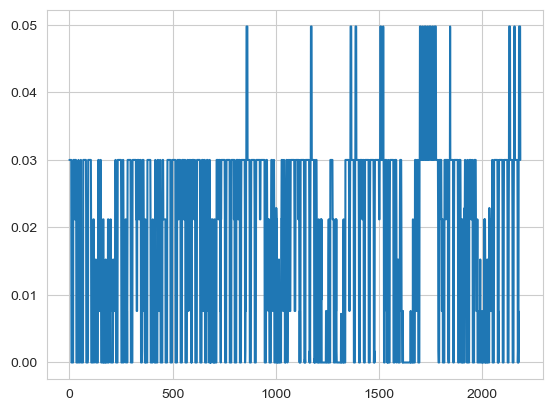

In [92]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price['system_balance'].loc[balance_price['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [93]:
variable_costs = model.results.cost_operation_variable.to_series().dropna()
generation = model.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs = variable_costs/generation

# tranform to a DataFrame
marginal_generation_costs = marginal_generation_costs.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs = marginal_generation_costs.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs.head()


,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768


In [94]:
# Merge marginal generation costs with balance price
merged = marginal_generation_costs.merge(
    balance_price,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768,0.03
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768,0.03
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768,0.03
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768,0.03
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768,0.03


In [95]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  51725 non-null  float64       
 6   system_balance            61313 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [96]:
# turn system_balance and marginal_generation_cost into float type
merged['system_balance'] = merged['system_balance'].astype(float)
merged['marginal_generation_cost'] = merged['marginal_generation_cost'].astype(float)
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  51725 non-null  float64       
 6   system_balance            61313 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [97]:
# Compute absolute difference between marginal cost and price
merged['diff'] = (merged['marginal_generation_cost'] - merged['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech = (
    merged.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.03,0.03,8.326230e-11
1,2024-10-01 01:00:00,NLD,hydro,0.03,0.03,1.605892e-10
2,2024-10-01 02:00:00,NLD,hydro,0.03,0.03,2.788782e-10
3,2024-10-01 03:00:00,NLD,hydro,0.03,0.03,4.568195e-10
4,2024-10-01 04:00:00,NLD,hydro,0.03,0.03,6.591110e-10


In [98]:
# display timesteps in days_of_interest only
marginal_tech_month = marginal_tech[marginal_tech['timesteps'].isin(days_of_interest)]
marginal_tech_month

,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.030000,0.030000,8.326230e-11
1,2024-10-01 01:00:00,NLD,hydro,0.030000,0.030000,1.605892e-10
2,2024-10-01 02:00:00,NLD,hydro,0.030000,0.030000,2.788782e-10
3,2024-10-01 03:00:00,NLD,hydro,0.030000,0.030000,4.568195e-10
4,2024-10-01 04:00:00,NLD,hydro,0.030000,0.030000,6.591110e-10
...,...,...,...,...,...,...
2180,2024-12-30 20:00:00,NLD,ccgt,0.049768,0.049768,1.497483e-10
2181,2024-12-30 21:00:00,NLD,ccgt,0.049768,0.049768,1.553688e-10
2182,2024-12-30 22:00:00,NLD,ccgt,0.049768,0.049768,3.063539e-10
2183,2024-12-30 23:00:00,NLD,ccgt,0.049768,0.049768,6.528621e-09


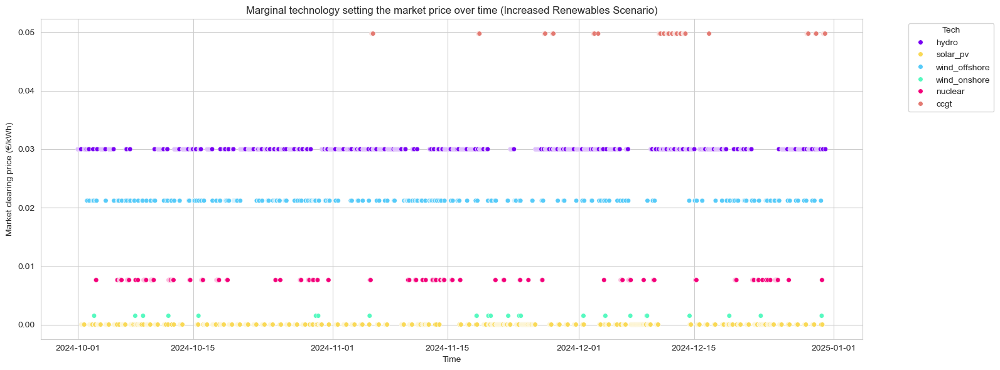

In [99]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_month,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Increased Renewables Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
hydro            955
solar_pv         689
wind_offshore    270
nuclear          175
ccgt              69
wind_onshore      27
Name: count, dtype: int64
techs
hydro            0.437071
solar_pv         0.315332
wind_offshore    0.123570
nuclear          0.080092
ccgt             0.031579
wind_onshore     0.012357
Name: share, dtype: float64
[2025-12-09 21:19:52] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\1600708007.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-09 21:19:52] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\1600708007.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




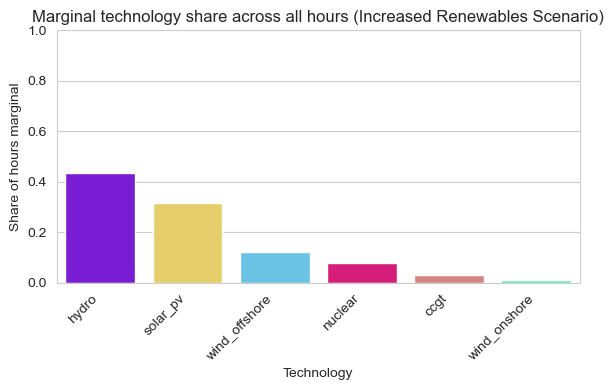

In [100]:
# Count how many hours each tech is marginal
freq = marginal_tech_month['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Marginal technology share across all hours (Increased Renewables Scenario)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 2.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [101]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [102]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/more_vres.nc', plot_export_path='results/more_vres.html')

[2025-12-09 21:19:53] INFO     Model: preprocessing data (reentry)
[2025-12-09 21:19:53] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:19:53] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:53] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:53] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:53] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:53] INFO     Model: initialisation complete


### 2.4.  Load, residual load and price duration curves

In [103]:
gen_techs = ['solar_pv','wind_onshore', 'wind_offshore', 'hydro', 'ccgt', 'nuclear'] 

In [104]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model = calliope.read_netcdf('results/more_vres.nc')

[2025-12-09 21:19:54] INFO     Model: preprocessing data (reentry)
[2025-12-09 21:19:54] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:19:54] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:54] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:54] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:54] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:54] INFO     Model: initialisation complete


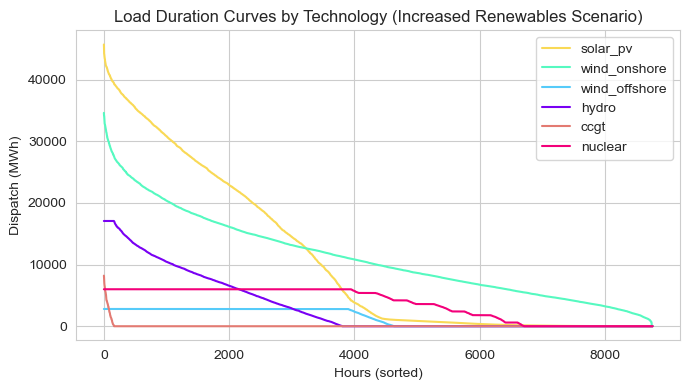

In [105]:
dispatch = {}
for tech in gen_techs:
    series = (
        model.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Increased Renewables Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [106]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price['system_balance'].to_frame(), 
                         plot_export_path='results/more_vres_price.html', 
                         y_label='Price (EUR/kWh)')

In [107]:
# Obtain demand from input
demand = model.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
wind_offshore_dispatch = model.results.flow_out.sel(techs='wind_offshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load = demand - (solar_pv_dispatch + wind_onshore_dispatch)
residual_load.head()

timesteps            nodes  carriers
2024-10-01 00:00:00  NLD    power       14708.129131
2024-10-01 01:00:00  NLD    power       13108.856927
2024-10-01 02:00:00  NLD    power       11760.103958
2024-10-01 03:00:00  NLD    power       10785.761851
2024-10-01 04:00:00  NLD    power       10239.028680
dtype: float64

In [108]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/more_vres_residual_load.html',
                         y_label='Residual Load (MWh)')


### 2.5. CO2 emissions

In [109]:
# to get hourly generation for all techs, power carrier only
power_gen = model.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [110]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [111]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [112]:
# Total across all emitting techs
total_emissions_t = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 205,139.31 tCO2

Total CO2 emissions: 205,139.31 tCO2
Total CO2 emissions: 0.205 MtCO2


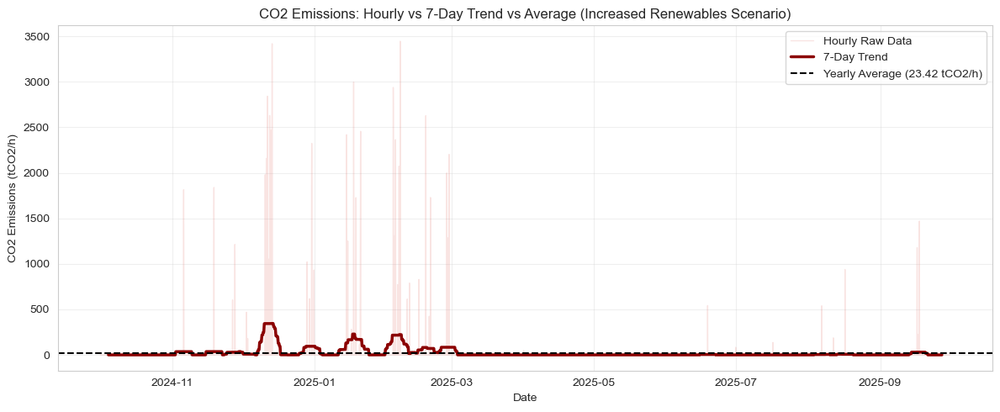

In [113]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Increased Renewables Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 2.6. Cost recovery

In [114]:
# Flow out for all gen techs in one go
dispatch = (
    model.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,2024-10-01 00:00:00,967.063553,7838.140650,2799.999737,5908.129369,0.000184,5999.999904
1,NLD,2024-10-01 01:00:00,932.515591,8436.710815,2799.999727,4308.857176,0.000185,5999.999901
2,NLD,2024-10-01 02:00:00,867.563562,8999.749147,2799.999716,2960.104226,0.000180,5999.999896
3,NLD,2024-10-01 03:00:00,808.710970,9633.943845,2799.999731,1985.762107,0.000177,5999.999896
4,NLD,2024-10-01 04:00:00,583.543934,10368.010719,2799.999755,1439.028919,0.000171,5999.999895


In [115]:
# Shadow price dataframe
balance_price = (
    model.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price

# Merge price into dispatch
df = balance_price.merge(dispatch, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,power,2024-10-01 00:00:00,0.03,NLD,967.063553,7838.140650,2799.999737,5908.129369,0.000184,5999.999904
1,NLD,power,2024-10-01 01:00:00,0.03,NLD,932.515591,8436.710815,2799.999727,4308.857176,0.000185,5999.999901
2,NLD,power,2024-10-01 02:00:00,0.03,NLD,867.563562,8999.749147,2799.999716,2960.104226,0.000180,5999.999896
3,NLD,power,2024-10-01 03:00:00,0.03,NLD,808.710970,9633.943845,2799.999731,1985.762107,0.000177,5999.999896
4,NLD,power,2024-10-01 04:00:00,0.03,NLD,583.543934,10368.010719,2799.999755,1439.028919,0.000171,5999.999895


In [116]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv         2.965582e+05
wind_onshore     1.415358e+06
wind_offshore    3.555871e+05
hydro            8.949040e+05
ccgt             2.430821e+04
nuclear          8.098677e+05
Name: revenue, dtype: float64

In [117]:
cost = (
    model.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost = cost.droplevel('costs')                # or just drop the level
cost.name = 'cost'
cost


techs
solar_pv            990.212637
wind_onshore     147968.660609
wind_offshore    252468.282490
hydro            840552.797515
ccgt              24308.237450
nuclear          246334.575435
Name: cost, dtype: float64

In [118]:
# calculate profit and cost recovery ratio
covery = pd.concat([revenue, cost], axis=1)
covery['profit'] = covery['revenue'] - covery['cost'] # >0 means revenue covers cost
covery['cost_recovery_ratio'] = covery['revenue'] / covery['cost']  # >1 means full recovery
covery

,revenue,cost,profit,cost_recovery_ratio
solar_pv,2.965582e+05,990.212637,2.955680e+05,299.489423
wind_onshore,1.415358e+06,147968.660609,1.267389e+06,9.565252
wind_offshore,3.555871e+05,252468.282490,1.031189e+05,1.408443
hydro,8.949040e+05,840552.797515,5.435123e+04,1.064661
ccgt,2.430821e+04,24308.237450,-2.355650e-02,0.999999
nuclear,8.098677e+05,246334.575435,5.635331e+05,3.287673


In [119]:
covery_df = covery.reset_index()
covery_df.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,2.965582e+05,990.212637,2.955680e+05,299.489423
1,wind_onshore,1.415358e+06,147968.660609,1.267389e+06,9.565252
2,wind_offshore,3.555871e+05,252468.282490,1.031189e+05,1.408443
3,hydro,8.949040e+05,840552.797515,5.435123e+04,1.064661
4,ccgt,2.430821e+04,24308.237450,-2.355650e-02,0.999999
5,nuclear,8.098677e+05,246334.575435,5.635331e+05,3.287673


[2025-12-09 21:19:55] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\3761037957.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-09 21:19:55] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\3761037957.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




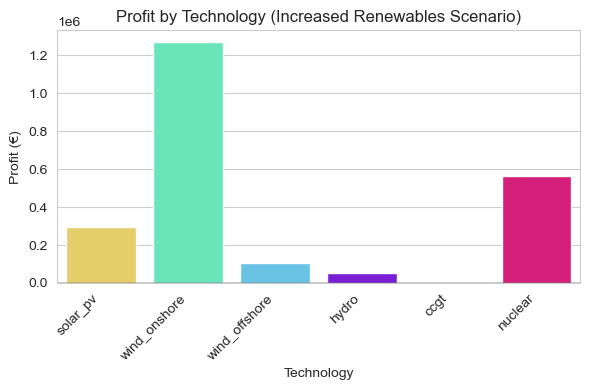

[2025-12-09 21:19:55] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\3761037957.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





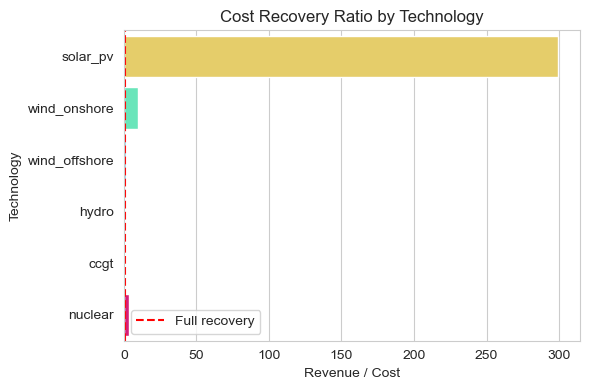

In [120]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Increased Renewables Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 3. Nuclear phase out
### 3.1 Reload the model with a scenario that forces a lower capacity of nuclear

In [121]:
model = calliope.read_yaml('model/model.yaml',scenario='less_nuclear')

[2025-12-09 21:19:55] INFO     Loading overrides from scenario: less_nuclear 
[2025-12-09 21:19:55] INFO     (scenarios, less_nuclear ) | Applying the following overrides: ['lower_nuclear'].
[2025-12-09 21:19:55] INFO     Math init | loading pre-defined math.
[2025-12-09 21:19:55] INFO     Math init | loading math files {'base', 'milp', 'operate', 'spores', 'storage_inter_cluster'}.
[2025-12-09 21:19:55] INFO     Model: preprocessing data
[2025-12-09 21:19:55] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:19:55] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:55] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:55] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:19:55] INFO     input data `name` not defined in model mat

In [122]:
model.build()
model.solve()

[2025-12-09 21:19:56] INFO     Model: backend build starting
[2025-12-09 21:19:56] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-09 21:19:56] INFO     Optimisation Model | variables | Generated.
[2025-12-09 21:19:58] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-09 21:20:03] INFO     Optimisation Model | constraints | Generated.
[2025-12-09 21:20:03] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-09 21:20:03] INFO     Optimisation Model | objectives | Generated.
[2025-12-09 21:20:03] INFO     Model: backend build complete
[2025-12-09 21:20:08] INFO     Optimisation model | starting model in base mode.
[2025-12-09 21:20:13] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmph3tmltcj.pyomo.lp
Reading time = 0.46 seconds
x1: 210208 rows, 140144 columns, 394141 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [123]:
model.to_netcdf('results/less_nuclear.nc')

### 3.2. Marginal technology

In [124]:
# Shadow price for the power system balance constraint
balance_price = model.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-10-01 00:00:00,0.03
1,NLD,power,2024-10-01 01:00:00,0.03
2,NLD,power,2024-10-01 02:00:00,0.03
3,NLD,power,2024-10-01 03:00:00,0.03
4,NLD,power,2024-10-01 04:00:00,0.03


<Axes: >

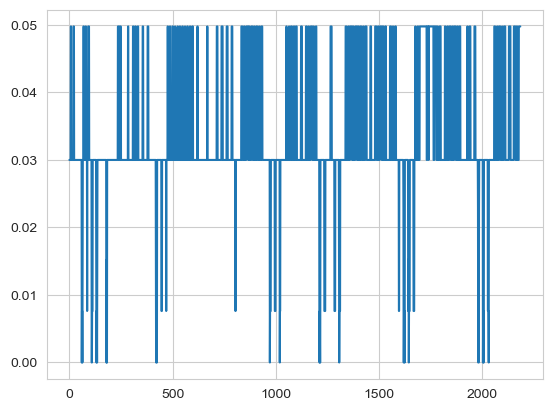

In [125]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price['system_balance'].loc[balance_price['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [126]:
variable_costs = model.results.cost_operation_variable.to_series().dropna()
generation = model.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs = variable_costs/generation

# tranform to a DataFrame
marginal_generation_costs = marginal_generation_costs.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs = marginal_generation_costs.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs.head()


,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768


In [127]:
# Merge marginal generation costs with balance price
merged = marginal_generation_costs.merge(
    balance_price,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768,0.03
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768,0.03
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768,0.03
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768,0.03
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768,0.03


In [128]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  52346 non-null  float64       
 6   system_balance            61313 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [129]:
# turn system_balance and marginal_generation_cost into float type
merged['system_balance'] = merged['system_balance'].astype(float)
merged['marginal_generation_cost'] = merged['marginal_generation_cost'].astype(float)
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  52346 non-null  float64       
 6   system_balance            61313 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [130]:
# Compute absolute difference between marginal cost and price
merged['diff'] = (merged['marginal_generation_cost'] - merged['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech = (
    merged.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.03,0.03,3.864199e-10
1,2024-10-01 01:00:00,NLD,hydro,0.03,0.03,2.159670e-10
2,2024-10-01 02:00:00,NLD,hydro,0.03,0.03,1.381813e-10
3,2024-10-01 03:00:00,NLD,hydro,0.03,0.03,1.015442e-10
4,2024-10-01 04:00:00,NLD,hydro,0.03,0.03,8.701779e-11


In [131]:
# display timesteps in days_of_interest only
marginal_tech_month = marginal_tech[marginal_tech['timesteps'].isin(days_of_interest)]
marginal_tech_month

,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.030000,0.030000,3.864199e-10
1,2024-10-01 01:00:00,NLD,hydro,0.030000,0.030000,2.159670e-10
2,2024-10-01 02:00:00,NLD,hydro,0.030000,0.030000,1.381813e-10
3,2024-10-01 03:00:00,NLD,hydro,0.030000,0.030000,1.015442e-10
4,2024-10-01 04:00:00,NLD,hydro,0.030000,0.030000,8.701779e-11
...,...,...,...,...,...,...
2180,2024-12-30 20:00:00,NLD,ccgt,0.049768,0.049768,5.627859e-11
2181,2024-12-30 21:00:00,NLD,ccgt,0.049768,0.049768,5.596296e-11
2182,2024-12-30 22:00:00,NLD,ccgt,0.049768,0.049768,9.485403e-11
2183,2024-12-30 23:00:00,NLD,ccgt,0.049768,0.049768,1.787507e-10


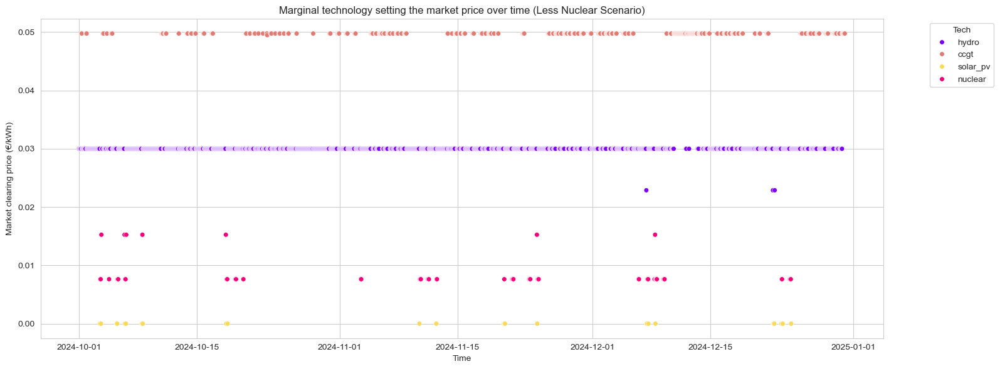

In [132]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_month,
    x='timesteps',
    y='system_balance',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Less Nuclear Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
hydro       1634
ccgt         452
nuclear       69
solar_pv      30
Name: count, dtype: int64
techs
hydro       0.747826
ccgt        0.206865
nuclear     0.031579
solar_pv    0.013730
Name: share, dtype: float64
[2025-12-09 21:20:20] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\563146429.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-09 21:20:21] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\563146429.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




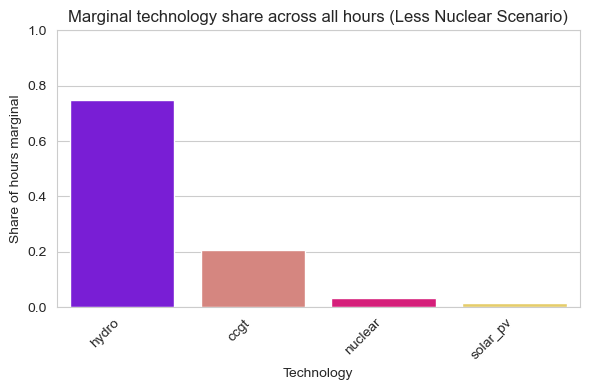

In [133]:
# Count how many hours each tech is marginal
freq = marginal_tech_month['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Marginal technology share across all hours (Less Nuclear Scenario)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 3.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [134]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [135]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/less_nuclear.nc', plot_export_path='results/less_nuclear_dispatch.html')

[2025-12-09 21:20:21] INFO     Model: preprocessing data (reentry)
[2025-12-09 21:20:21] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:20:21] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:21] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:21] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:21] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:21] INFO     Model: initialisation complete


### 3.4.  Load, residual load and price duration curves

In [136]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [137]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model = calliope.read_netcdf('results/less_nuclear.nc')

[2025-12-09 21:20:22] INFO     Model: preprocessing data (reentry)
[2025-12-09 21:20:22] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:20:22] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:22] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:23] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:23] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:23] INFO     Model: initialisation complete


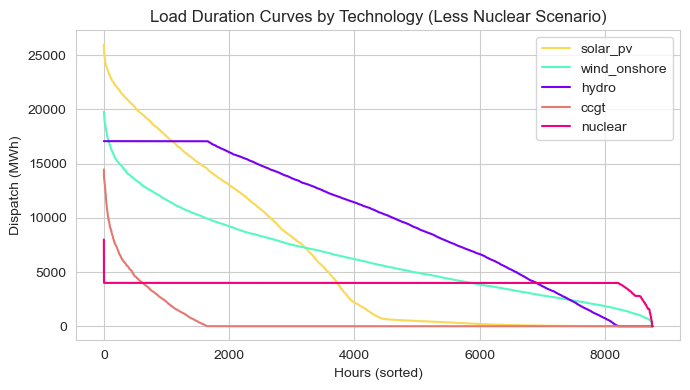

In [138]:
dispatch = {}
for tech in gen_techs:
    series = (
        model.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Less Nuclear Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [139]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price['system_balance'].to_frame(), 
                         plot_export_path='results/less_nuclear_price.html', 
                         y_label='Price (EUR/kWh)')

In [140]:
# Obtain demand from input
demand = model.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model.results.flow_out.sel(techs='wind_onshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load = demand - (solar_pv_dispatch + wind_onshore_dispatch)
residual_load.head()

timesteps            nodes  carriers
2024-10-01 00:00:00  NLD    power       18482.351060
2024-10-01 01:00:00  NLD    power       17124.547769
2024-10-01 02:00:00  NLD    power       15988.931413
2024-10-01 03:00:00  NLD    power       15260.833297
2024-10-01 04:00:00  NLD    power       14931.385135
dtype: float64

In [141]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/less_nuclear_residual_load.html',
                         y_label='Residual Load (MWh)')


### 3.5. CO2 emissions

In [142]:
# to get hourly generation for all techs, power carrier only
power_gen = model.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [143]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [144]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [145]:
# Total across all emitting techs
total_emissions_t = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 2,533,763.26 tCO2

Total CO2 emissions: 2,533,763.26 tCO2
Total CO2 emissions: 2.534 MtCO2


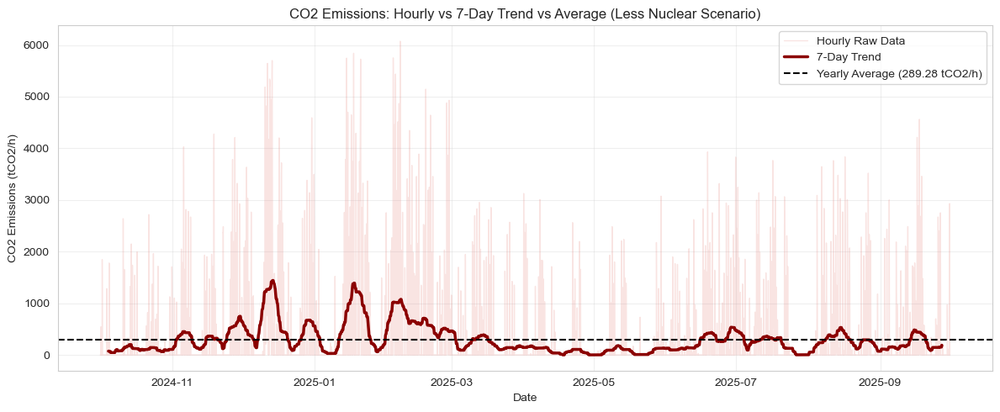

In [146]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Less Nuclear Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 3.6. Cost recovery

In [147]:
# Flow out for all gen techs in one go
dispatch = (
    model.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-10-01 00:00:00,549.950238,4481.032035,14482.351103,0.000095,3999.999916
1,NLD,2024-10-01 01:00:00,530.303485,4823.232080,13124.547812,0.000095,3999.999916
2,NLD,2024-10-01 02:00:00,493.366528,5145.118725,11988.931456,0.000095,3999.999916
3,NLD,2024-10-01 03:00:00,459.898204,5507.685166,11260.833340,0.000095,3999.999916
4,NLD,2024-10-01 04:00:00,331.850088,5927.348110,10931.385178,0.000095,3999.999916


In [148]:
# Shadow price dataframe
balance_price = (
    model.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price

# Merge price into dispatch
df = balance_price.merge(dispatch, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-10-01 00:00:00,0.03,NLD,549.950238,4481.032035,14482.351103,0.000095,3999.999916
1,NLD,power,2024-10-01 01:00:00,0.03,NLD,530.303485,4823.232080,13124.547812,0.000095,3999.999916
2,NLD,power,2024-10-01 02:00:00,0.03,NLD,493.366528,5145.118725,11988.931456,0.000095,3999.999916
3,NLD,power,2024-10-01 03:00:00,0.03,NLD,459.898204,5507.685166,11260.833340,0.000095,3999.999916
4,NLD,power,2024-10-01 04:00:00,0.03,NLD,331.850088,5927.348110,10931.385178,0.000095,3999.999916


In [149]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv        1.399268e+06
wind_onshore    1.761161e+06
hydro           3.165375e+06
ccgt            3.002414e+05
nuclear         1.126245e+06
Name: revenue, dtype: float64

In [150]:
cost = (
    model.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost = cost.droplevel('costs')                # or just drop the level
cost.name = 'cost'
cost


techs
solar_pv        5.632124e+02
wind_onshore    8.459306e+04
hydro           2.608702e+06
ccgt            3.002414e+05
nuclear         2.620275e+05
Name: cost, dtype: float64

In [151]:
# calculate profit and cost recovery ratio
covery = pd.concat([revenue, cost], axis=1)
covery['profit'] = covery['revenue'] - covery['cost'] # >0 means revenue covers cost
covery['cost_recovery_ratio'] = covery['revenue'] / covery['cost']  # >1 means full recovery
covery

,revenue,cost,profit,cost_recovery_ratio
solar_pv,1.399268e+06,5.632124e+02,1.398705e+06,2484.440614
wind_onshore,1.761161e+06,8.459306e+04,1.676568e+06,20.819214
hydro,3.165375e+06,2.608702e+06,5.566735e+05,1.213391
ccgt,3.002414e+05,3.002414e+05,-1.561488e-02,1.000000
nuclear,1.126245e+06,2.620275e+05,8.642177e+05,4.298194


In [152]:
covery_df = covery.reset_index()
covery_df.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,1.399268e+06,5.632124e+02,1.398705e+06,2484.440614
1,wind_onshore,1.761161e+06,8.459306e+04,1.676568e+06,20.819214
2,hydro,3.165375e+06,2.608702e+06,5.566735e+05,1.213391
3,ccgt,3.002414e+05,3.002414e+05,-1.561488e-02,1.000000
4,nuclear,1.126245e+06,2.620275e+05,8.642177e+05,4.298194


[2025-12-09 21:20:24] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\1503451265.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-09 21:20:24] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\1503451265.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




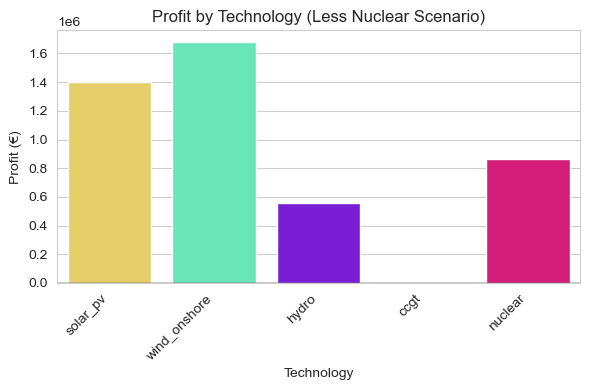

[2025-12-09 21:20:24] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\1503451265.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





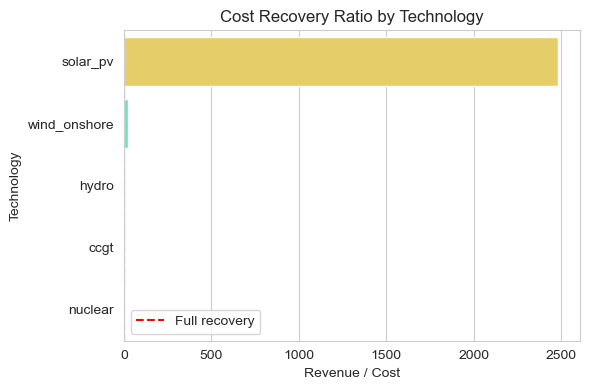

In [153]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Less Nuclear Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 4. Combine increasing renewables and nuclear phase out
### 4.1 Reload the model with a scenario that forces a higher renewables and lower capacity of nuclear

In [154]:
model = calliope.read_yaml('model/model.yaml',scenario='combination')

[2025-12-09 21:20:24] INFO     Loading overrides from scenario: combination 
[2025-12-09 21:20:24] INFO     (scenarios, combination ) | Applying the following overrides: ['higher_wind', 'lower_nuclear', 'higher_solar'].
[2025-12-09 21:20:24] INFO     Math init | loading pre-defined math.
[2025-12-09 21:20:24] INFO     Math init | loading math files {'base', 'milp', 'operate', 'spores', 'storage_inter_cluster'}.
[2025-12-09 21:20:24] INFO     Model: preprocessing data
[2025-12-09 21:20:24] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:20:25] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:25] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:25] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:25] INFO     input data `n

In [155]:
model.build()
model.solve()

[2025-12-09 21:20:25] INFO     Model: backend build starting
[2025-12-09 21:20:26] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-09 21:20:26] INFO     Optimisation Model | variables | Generated.
[2025-12-09 21:20:28] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-09 21:20:33] INFO     Optimisation Model | constraints | Generated.
[2025-12-09 21:20:33] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-09 21:20:33] INFO     Optimisation Model | objectives | Generated.
[2025-12-09 21:20:33] INFO     Model: backend build complete
[2025-12-09 21:20:36] INFO     Optimisation model | starting model in base mode.
[2025-12-09 21:20:40] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmptdkdanlf.pyomo.lp
Reading time = 0.42 seconds
x1: 210208 rows, 140144 columns, 394141 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [156]:
model.to_netcdf('results/combination.nc')

### 4.2. Marginal technology

In [157]:
# Shadow price for the power system balance constraint
balance_price = model.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-10-01 00:00:00,0.03
1,NLD,power,2024-10-01 01:00:00,0.03
2,NLD,power,2024-10-01 02:00:00,0.03
3,NLD,power,2024-10-01 03:00:00,0.03
4,NLD,power,2024-10-01 04:00:00,0.03


<Axes: >

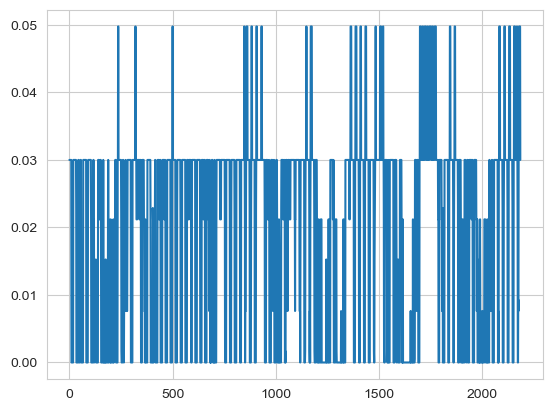

In [158]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price['system_balance'].loc[balance_price['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [159]:
variable_costs = model.results.cost_operation_variable.to_series().dropna()
generation = model.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs = variable_costs/generation

# tranform to a DataFrame
marginal_generation_costs = marginal_generation_costs.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs = marginal_generation_costs.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs.head()


,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768


In [160]:
# Merge marginal generation costs with balance price
merged = marginal_generation_costs.merge(
    balance_price,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-10-01 00:00:00,power,0.049768,0.03
1,NLD,ccgt,monetary,2024-10-01 01:00:00,power,0.049768,0.03
2,NLD,ccgt,monetary,2024-10-01 02:00:00,power,0.049768,0.03
3,NLD,ccgt,monetary,2024-10-01 03:00:00,power,0.049768,0.03
4,NLD,ccgt,monetary,2024-10-01 04:00:00,power,0.049768,0.03


In [161]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  51725 non-null  float64       
 6   system_balance            61313 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [162]:
# turn system_balance and marginal_generation_cost into float type
merged['system_balance'] = merged['system_balance'].astype(float)
merged['marginal_generation_cost'] = merged['marginal_generation_cost'].astype(float)
merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61313 entries, 0 to 61312
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61313 non-null  object        
 1   techs                     61313 non-null  object        
 2   costs                     61313 non-null  object        
 3   timesteps                 61313 non-null  datetime64[ns]
 4   carriers                  61313 non-null  object        
 5   marginal_generation_cost  51725 non-null  float64       
 6   system_balance            61313 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [163]:
# Compute absolute difference between marginal cost and price
merged['diff'] = (merged['marginal_generation_cost'] - merged['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech = (
    merged.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-10-01 00:00:00,NLD,hydro,0.03,0.03,6.430981e-12
1,2024-10-01 01:00:00,NLD,hydro,0.03,0.03,2.427349e-11
2,2024-10-01 02:00:00,NLD,hydro,0.03,0.03,4.403367e-11
3,2024-10-01 03:00:00,NLD,hydro,0.03,0.03,6.452976e-11
4,2024-10-01 04:00:00,NLD,hydro,0.03,0.03,8.041223e-11


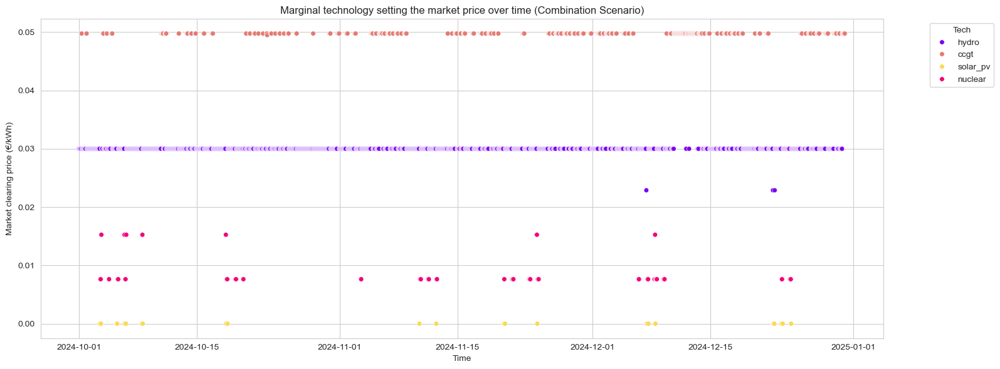

In [164]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_month,
    x='timesteps',
    y='system_balance',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Combination Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
hydro       1634
ccgt         452
nuclear       69
solar_pv      30
Name: count, dtype: int64
techs
hydro       0.747826
ccgt        0.206865
nuclear     0.031579
solar_pv    0.013730
Name: share, dtype: float64
[2025-12-09 21:20:46] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\990049412.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-09 21:20:46] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\990049412.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




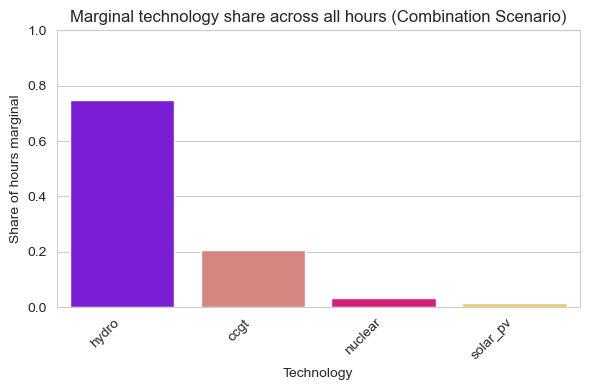

In [165]:
# Count how many hours each tech is marginal
freq = marginal_tech_month['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Marginal technology share across all hours (Combination Scenario)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 4.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [166]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [167]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/combination.nc', plot_export_path='results/combination.html')

[2025-12-09 21:20:46] INFO     Model: preprocessing data (reentry)
[2025-12-09 21:20:46] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:20:46] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:46] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:46] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:46] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:46] INFO     Model: initialisation complete


### 4.4.  Load, residual load and price duration curves

In [168]:
gen_techs = ['solar_pv','wind_onshore', 'wind_offshore', 'hydro', 'ccgt', 'nuclear'] 

In [169]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model = calliope.read_netcdf('results/combination.nc')

[2025-12-09 21:20:47] INFO     Model: preprocessing data (reentry)
[2025-12-09 21:20:47] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-09 21:20:47] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:47] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:47] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:47] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-09 21:20:47] INFO     Model: initialisation complete


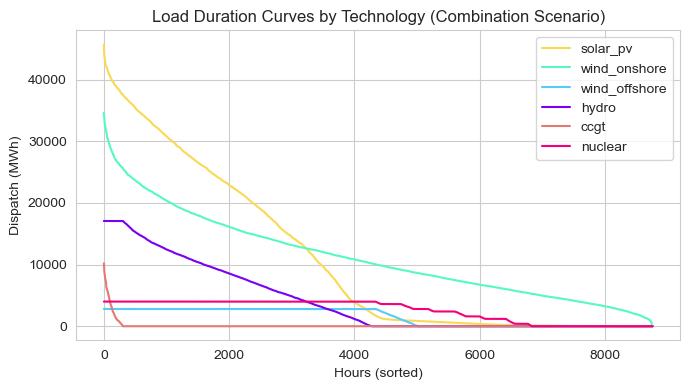

In [170]:
dispatch = {}
for tech in gen_techs:
    series = (
        model.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Combination Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [171]:
# Suppose we want to plot the LDC of the dispatch of the CCGT power plant
ccgt_dispatch = model.results.flow_out.sel(techs='ccgt').to_series().dropna()
ccgt_dispatch.head()

nodes  carriers  timesteps          
NLD    power     2024-10-01 00:00:00    0.000044
                 2024-10-01 01:00:00    0.000045
                 2024-10-01 02:00:00    0.000045
                 2024-10-01 03:00:00    0.000045
                 2024-10-01 04:00:00    0.000045
Name: flow_out, dtype: float64

In [172]:
plot_load_duration_curve(dataframe=ccgt_dispatch.to_frame(), 
                         plot_export_path='results/combination_ccgt_ldc.html', 
                         y_label='Flow out (MWh)')

In [173]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price['system_balance'].to_frame(), 
                         plot_export_path='results/combination_price.html', 
                         y_label='Price (EUR/kWh)')

In [174]:
# Obtain demand from input
demand = model.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
wind_offshore_dispatch = model.results.flow_out.sel(techs='wind_offshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load = demand - (solar_pv_dispatch + wind_onshore_dispatch + wind_offshore_dispatch)
residual_load.head()

timesteps            nodes  carriers
2024-10-01 00:00:00  NLD    power       11908.129207
2024-10-01 01:00:00  NLD    power       10308.857003
2024-10-01 02:00:00  NLD    power        8960.104034
2024-10-01 03:00:00  NLD    power        7985.761927
2024-10-01 04:00:00  NLD    power        7439.028755
dtype: float64

In [175]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/combination_residual_load.html',
                         y_label='Residual Load (MWh)')


### 4.5. CO2 emissions

In [176]:
# to get hourly generation for all techs, power carrier only
power_gen = model.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [177]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [178]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [179]:
# Total across all emitting techs
total_emissions_t = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 394,409.71 tCO2

Total CO2 emissions: 394,409.71 tCO2
Total CO2 emissions: 0.394 MtCO2


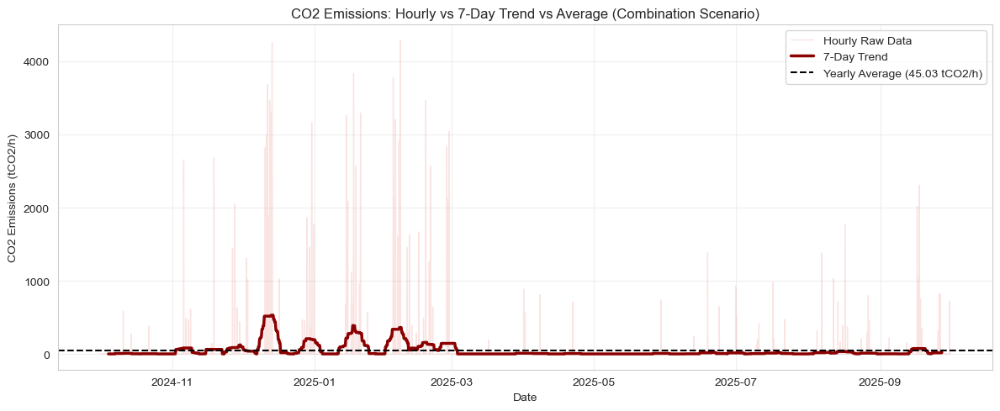

In [180]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Combination Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 4.6. Cost recovery

In [181]:
# Flow out for all gen techs in one go
dispatch = (
    model.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,2024-10-01 00:00:00,967.063553,7838.140650,2799.999923,7908.129212,0.000044,3999.999971
1,NLD,2024-10-01 01:00:00,932.515591,8436.710815,2799.999923,6308.857008,0.000045,3999.999971
2,NLD,2024-10-01 02:00:00,867.563562,8999.749147,2799.999924,4960.104038,0.000045,3999.999971
3,NLD,2024-10-01 03:00:00,808.710970,9633.943845,2799.999924,3985.761931,0.000045,3999.999971
4,NLD,2024-10-01 04:00:00,583.543934,10368.010719,2799.999925,3439.028759,0.000045,3999.999971


In [182]:
# Shadow price dataframe
balance_price = (
    model.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price

# Merge price into dispatch
df = balance_price.merge(dispatch, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,power,2024-10-01 00:00:00,0.03,NLD,967.063553,7838.140650,2799.999923,7908.129212,0.000044,3999.999971
1,NLD,power,2024-10-01 01:00:00,0.03,NLD,932.515591,8436.710815,2799.999923,6308.857008,0.000045,3999.999971
2,NLD,power,2024-10-01 02:00:00,0.03,NLD,867.563562,8999.749147,2799.999924,4960.104038,0.000045,3999.999971
3,NLD,power,2024-10-01 03:00:00,0.03,NLD,808.710970,9633.943845,2799.999924,3985.761931,0.000045,3999.999971
4,NLD,power,2024-10-01 04:00:00,0.03,NLD,583.543934,10368.010719,2799.999925,3439.028759,0.000045,3999.999971


In [183]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv         3.517075e+05
wind_onshore     1.582901e+06
wind_offshore    4.000236e+05
hydro            1.169674e+06
ccgt             4.673606e+04
nuclear          5.963921e+05
Name: revenue, dtype: float64

In [184]:
cost = (
    model.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost = cost.droplevel('costs')                # or just drop the level
cost.name = 'cost'
cost


techs
solar_pv         9.902126e+02
wind_onshore     1.479687e+05
wind_offshore    2.775457e+05
hydro            1.066710e+06
ccgt             4.673607e+04
nuclear          1.722502e+05
Name: cost, dtype: float64

In [185]:
# calculate profit and cost recovery ratio
covery = pd.concat([revenue, cost], axis=1)
covery['profit'] = covery['revenue'] - covery['cost'] # >0 means revenue covers cost
covery['cost_recovery_ratio'] = covery['revenue'] / covery['cost']  # >1 means full recovery
covery

,revenue,cost,profit,cost_recovery_ratio
solar_pv,3.517075e+05,9.902126e+02,3.507173e+05,355.183816
wind_onshore,1.582901e+06,1.479687e+05,1.434932e+06,10.697539
wind_offshore,4.000236e+05,2.775457e+05,1.224779e+05,1.441289
hydro,1.169674e+06,1.066710e+06,1.029635e+05,1.096524
ccgt,4.673606e+04,4.673607e+04,-6.219650e-03,1.000000
nuclear,5.963921e+05,1.722502e+05,4.241419e+05,3.462360


In [186]:
covery_df = covery.reset_index()
covery_df.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,3.517075e+05,9.902126e+02,3.507173e+05,355.183816
1,wind_onshore,1.582901e+06,1.479687e+05,1.434932e+06,10.697539
2,wind_offshore,4.000236e+05,2.775457e+05,1.224779e+05,1.441289
3,hydro,1.169674e+06,1.066710e+06,1.029635e+05,1.096524
4,ccgt,4.673606e+04,4.673607e+04,-6.219650e-03,1.000000
5,nuclear,5.963921e+05,1.722502e+05,4.241419e+05,3.462360


[2025-12-09 21:20:48] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\707107519.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-09 21:20:48] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\707107519.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




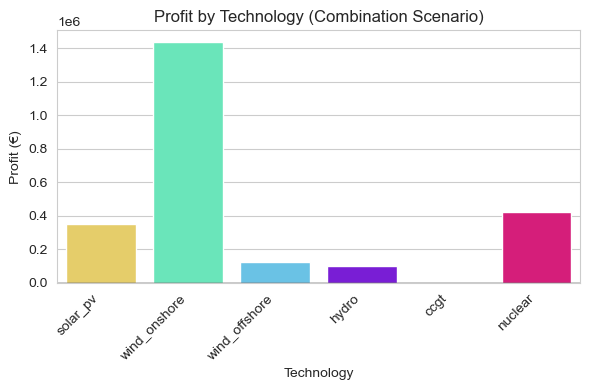

[2025-12-09 21:20:48] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_34120\707107519.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





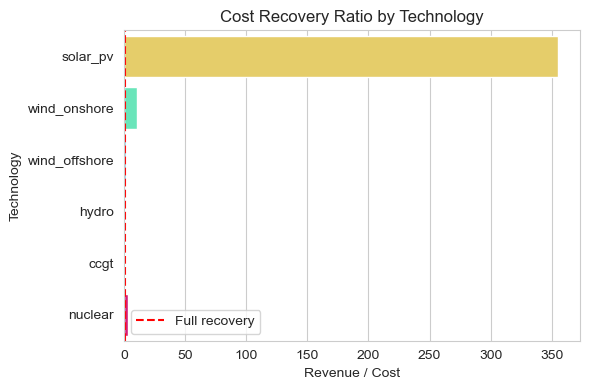

In [187]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Combination Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()